## Camera Calibration 

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

%matplotlib inline

In [2]:
def calibrate_camera():
    # Arrays to store object points and image points from all the images
    objpoints = [] # 3D points in real world space
    imgpoints = [] # 2D points in image plane
    
    # Number of inner corners per row and column
    nx = 9
    ny = 6
    
    # Prepare object points by creating  6x8 points in an array each with 3 columns for the x,y,z coordinates of each corner
    objp = np.zeros((ny*nx, 3), np.float32)
    
    # Use numpy mgrid function to generate the coordinates that we want
    objp[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    
    # List of paths of camera calibration images
    image_names = glob.glob("camera_cal/*")
    
    # Loop through all the calibration images
    for name in image_names:
        # Read in the image
        img = mpimg.imread(name)

        # Convert the image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        if(ret):
            image = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            #If corners are found, add image points and object points
            imgpoints.append(corners)
            # Object points will be the same for all of the calibration images
            # Since they represent a real chessboard
            objpoints.append(objp)
    return cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2], None, None)

In [3]:
# Calibrate the camera
ret, mtx, dist, rvecs, tvecs = calibrate_camera()

## Un-Distort

In [4]:
def undistort(image):
    """
        Simple wrapper that un distorts an image
        Using previously computed camera matrix and
        distortion coefficients
    """
    return cv2.undistort(image, mtx, dist)

In [5]:
def plot_on_subplots(images, titles, cmap=None):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    
    if cmap:
        ax1.imshow(images[0], cmap=cmap)
    else:
        ax1.imshow(images[0])
    ax1.set_title(titles[0])

    if(cmap):
        ax2.imshow(images[1], cmap=cmap)
    else:
        ax2.imshow(images[1])
        
    ax2.set_title(titles[1])
    

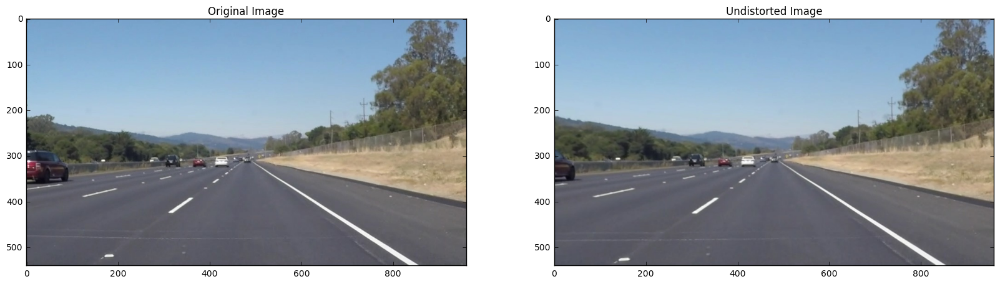

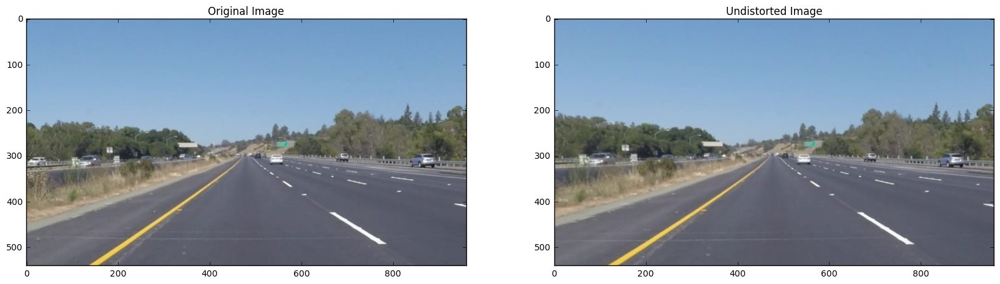

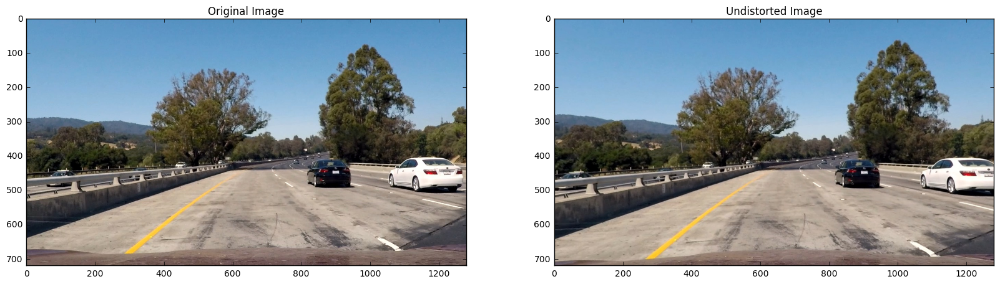

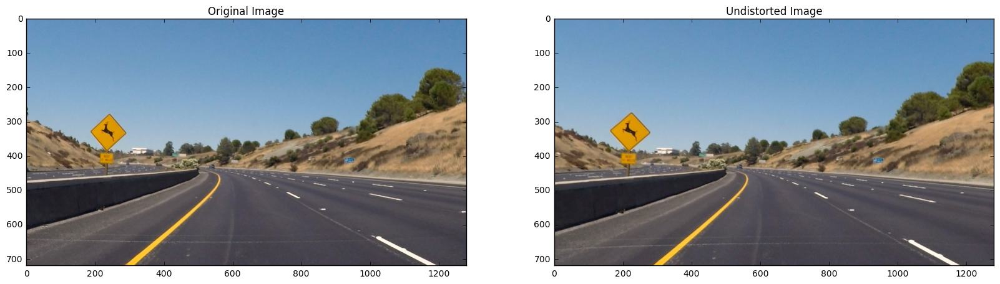

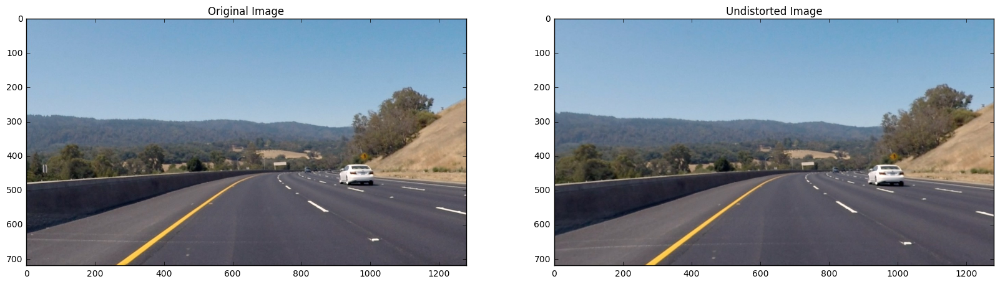

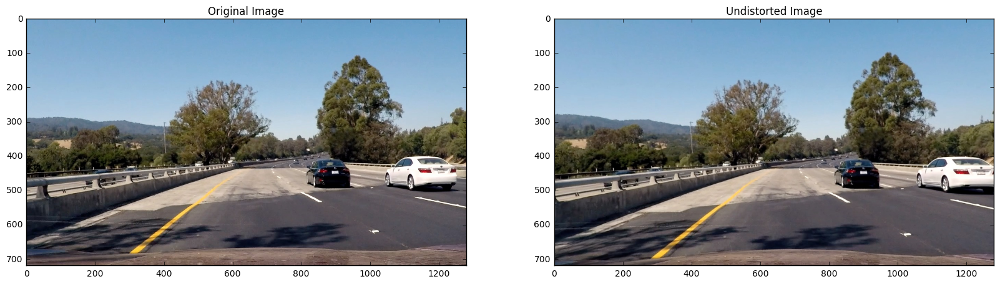

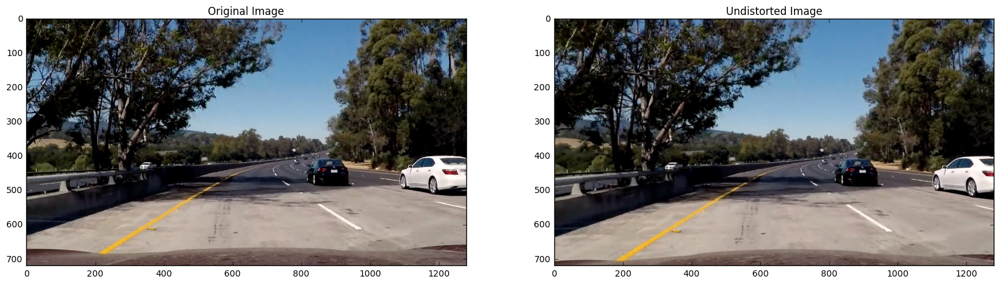

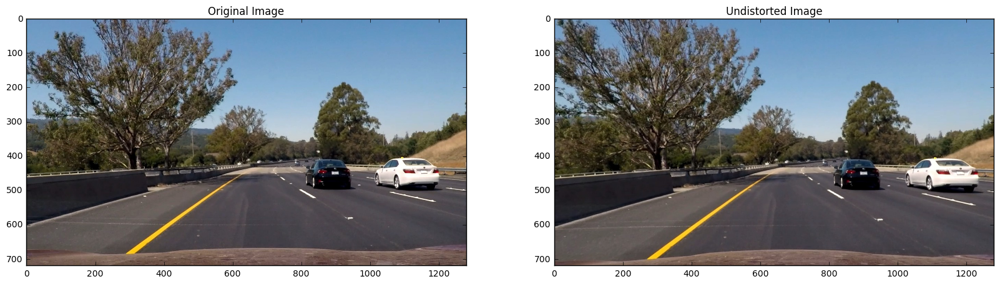

In [6]:
# Perform un-distortion on the test images
for image_name in glob.glob("test_images/*"):
    img = mpimg.imread(image_name)
    un_dist_img = undistort(img)
    
    plot_on_subplots([img, un_dist_img], ["Original Image", "Undistorted Image"])
    plt.show()

In [7]:
def gaussian_blur(img, kernel_size=5):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

## Binary Image generator

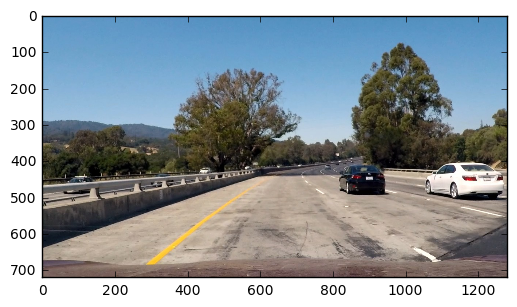

In [303]:
image = mpimg.imread(glob.glob("test_images/*")[2])
plt.imshow(image)

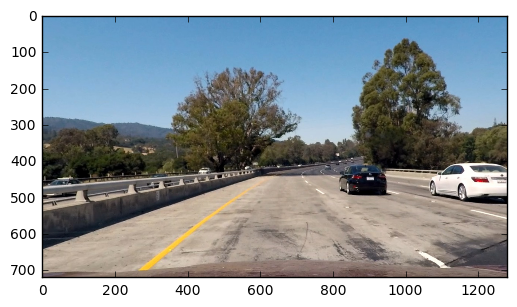

In [304]:
image = undistort(image)
plt.imshow(image)

In [305]:
def perform_color_selection(img):
    img[img[:] < 70] = 0
    return img

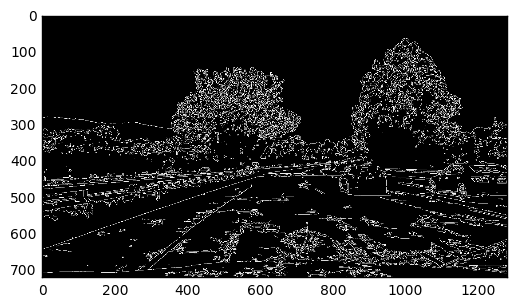

In [306]:
canny = cv2.Canny(perform_color_selection(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)), 0, 150)
plt.imshow(canny, cmap="gray")

In [309]:
def get_grayscale_thresholded_img(img, thresh=(200, 255)):
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    binary = np.zeros_like(gray)
    
    binary[(gray > thresh[0]) & (gray < thresh[1])] = 1
    
    return binary

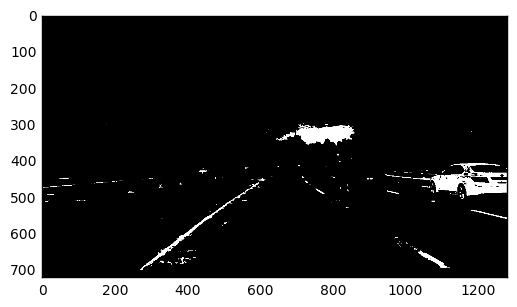

In [310]:
gti = get_grayscale_thresholded_img(image)
plt.imshow(gti, cmap="gray")

In [311]:
def get_sobel_binary(image, thresh_min=20, thresh_max=200):
    """
        Return a binary images after application
        of a sobel filter and thresholds to the result
    """
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Take the derivative in x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) 
    
    # Absolute x derivative to accentuate lines away from horizontal
    abs_sobelx = np.absolute(sobelx) 
    
    # Scale to 8 bit grayscale image
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Apply a threshold
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    return sxbinary

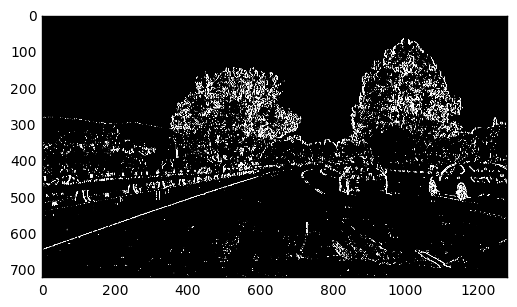

In [312]:
sobel_binary = get_sobel_binary(image)
plt.imshow(sobel_binary, cmap="gray")

In [313]:
def get_channel_index_hls(chanel_name):
    """
        Returns the index of each channel
        for an image in HLS color channel
    """
    if(chanel_name == "h"):
        return 0
    elif(chanel_name == "l"):
        return 1
    elif(chanel_name == "s"):
        return 2

In [314]:
def get_hls_channel_binary(image, channel_name='s', thresh_min=90, thresh_max=255):
    # Convert to HLS color space
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    
    # Extract the desired channel
    channel_index = get_channel_index_hls(channel_name)
    channel = hls[:,:,channel_index]
    
    # Apply the threshold
    channel_binary = np.zeros_like(channel)
    channel_binary[(channel >= thresh_min) & (channel <= thresh_max)] = 1
    
    return channel_binary    

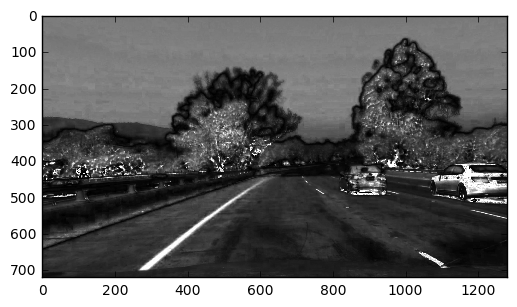

In [315]:
plt.imshow(cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,2], cmap="gray")

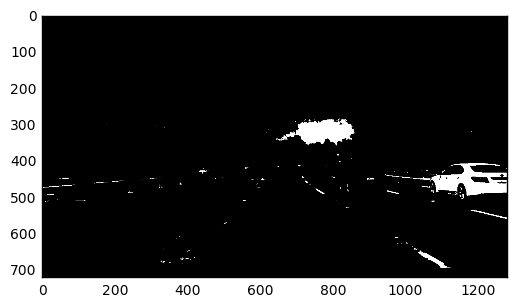

In [316]:
s_binary = get_hls_channel_binary(image, channel_name="l", thresh_min=200)
#s_binary = get_hls_channel_binary(image)
plt.imshow(s_binary, cmap="gray")

In [317]:
def get_binary_image(image):
    """
        Combines both gradient and color channel
        thresholds to create a binary image
    """
    #sobel_binary = get_sobel_binary(image)
    
    s_channel_binary = get_hls_channel_binary(image)

    l_channel_binary = get_hls_channel_binary(image, channel_name="l", thresh_min=200)

    gray_scale_thresholded_image = get_grayscale_thresholded_img(image)
    
    combined_binary = np.zeros_like(s_channel_binary)

    combined_binary[ (s_channel_binary == 1) | (gray_scale_thresholded_image == 1)] = 1
    
    return combined_binary

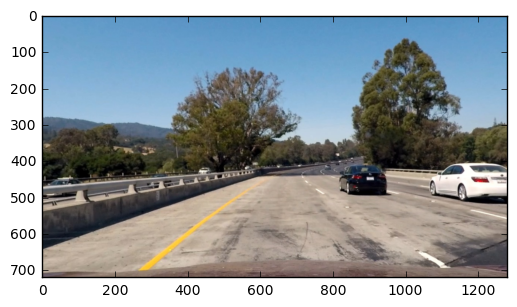

In [318]:
image = gaussian_blur(image)
plt.imshow(image, cmap="gray")

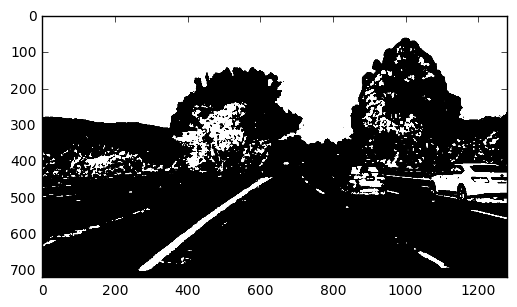

In [319]:
image = get_binary_image(image)
plt.imshow(image, cmap="gray")

## Region of Interest Selection

In [320]:
def select_region_of_interest(image):
    """
        Given an image, this function returns an image
        with only the part which is likely to contain lane lines
        not masked out
    """
    bottom_left = (image.shape[1] * 0.15, image.shape[0])
    bottom_right = (image.shape[1] * 0.93, image.shape[0])

    top_left = (image.shape[1] * 0.4 , image.shape[0]/2)
    top_right = (image.shape[1] * 0.6 , image.shape[0]/2)
    
    white = np.zeros_like(image)
    points = np.array([[bottom_left, top_left, top_right, bottom_right]], dtype=np.int32)
    cv2.fillPoly(white, points , 255)
    
    masked_image = cv2.bitwise_and(image, white)
    
    #cv2.polylines(masked_image, points, False, 255)

    return masked_image

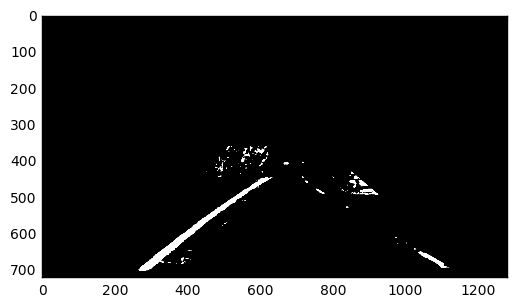

In [321]:
image = select_region_of_interest(image)
plt.imshow(image, cmap="gray")

In [346]:

# Hough transform parameters
rho = 1 # distance resolution in pixels of the Hough grid
theta = np.pi/180 # angular resolution in radians of the Hough grid
threshold = 30     # minimum number of votes (intersections in Hough grid cell)
min_line_length = 1 # minimum number of pixels making up a line
max_line_gap = 5    # maximum gap in pixels between connectable line segments

gaussian_kernel_size = 5

canny_low_threshold = 50
canny_high_threshold = 150

def draw_single_line(img, lines, y_min, y_max, color, thickness):
    points = []
    total_slope = 0
    total_y_intercept = 0
    n = len(lines)
    for line in lines:
        for x1,y1,x2,y2 in line:
            slope = (y2 - y1)/(x2 - x1)
            total_slope += slope
            total_y_intercept += (y1 - slope * x1)
    
    average_slope = total_slope/n
    average_y_intercept = total_y_intercept/n
    
    x1 = int((y_min - average_y_intercept)/average_slope)
    x2 = int((y_max - average_y_intercept)/average_slope)
    
    cv2.line(img, (x1, y_min), (x2, y_max), color, thickness)


def find_slope(line):
    return (line[0][3]-line[0][1])/(line[0][2]-line[0][0])

def draw_lines(img, lines, color=[255, 0, 0], thickness=2):
    """
    NOTE: this is the function you might want to use as a starting point once you want to 
    average/extrapolate the line segments you detect to map out the full
    extent of the lane (going from the result shown in raw-lines-example.mp4
    to that shown in P1_example.mp4).  
    
    Think about things like separating line segments by their 
    slope ((y2-y1)/(x2-x1)) to decide which segments are part of the left
    line vs. the right line.  Then, you can average the position of each of 
    the lines and extrapolate to the top and bottom of the lane.
    
    This function draws `lines` with `color` and `thickness`.    
    Lines are drawn on the image inplace (mutates the image).
    If you want to make the lines semi-transparent, think about combining
    this function with the weighted_img() function below
    """
    # Find the global y_min
    y_min_point1 = min(lines, key=lambda x: x[0][1])
    y_min_point2 = min(lines, key=lambda x: x[0][3])
    y_min = max(y_min_point1[0][1], y_min_point2[0][3])
    
    y_max = img.shape[0]
    
    positive_slopes = list(filter(lambda line: (find_slope(line) > 0.1) and (find_slope(line) < 0.7) and (find_slope(line) < np.inf), lines))
                                                                              
    negative_slopes = list(filter(lambda line: (find_slope(line) < -0.1) and (find_slope(line) > -0.7) and (find_slope(line) > -np.inf) , lines))
                           
    draw_single_line(img, positive_slopes, y_min, y_max, color, thickness)
    draw_single_line(img, negative_slopes, y_min, y_max, color, thickness)
    
def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros(img.shape, dtype=np.uint8)
    draw_lines(line_img, lines, thickness=5)
    return line_img

# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)


def get_blank_image(image):
    """
        Return a blank image with the same dimensions as
        the input image
    """
    return np.zeros(image.shape, dtype=np.uint8)

In [347]:
lines_image = hough_lines(image, rho=rho, theta=theta, threshold=threshold, min_line_len=min_line_length, max_line_gap=max_line_gap)

In [348]:
colored_lines_image = np.dstack((lines_image, get_blank_image(lines_image), get_blank_image(lines_image)))
final = weighted_img(colored_lines_image, mpimg.imread(glob.glob("test_images/*")[2]))

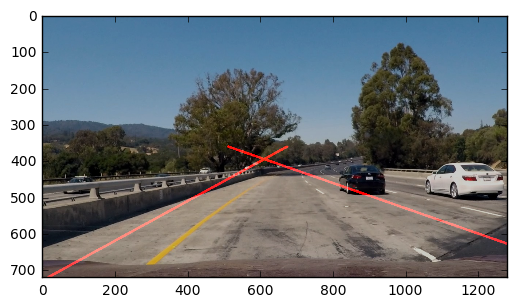

In [349]:
plt.imshow(final)

In [350]:
def process_image(image):
    """
        Return the result of passing the image
        through the pipeline
    """
    
    blurred_img = gaussian_blur(image)
    
    undistorted_image = undistort(blurred_img)
    
    binary_image = get_binary_image(undistorted_image)
    
    roi_image = select_region_of_interest(binary_image)
    
    lines_image = hough_lines(roi_image, rho=rho, theta=theta, threshold=threshold, min_line_len=min_line_length, max_line_gap=max_line_gap)
    
    colored_lines_image = np.dstack((lines_image, get_blank_image(lines_image), get_blank_image(lines_image)))
    
    final = weighted_img(colored_lines_image, image)
    ##
    ##
    ##
    plot_on_subplots([roi_image, final], ["Original Image", "Processed Image"], cmap="gray")
    return final

ZeroDivisionError: division by zero

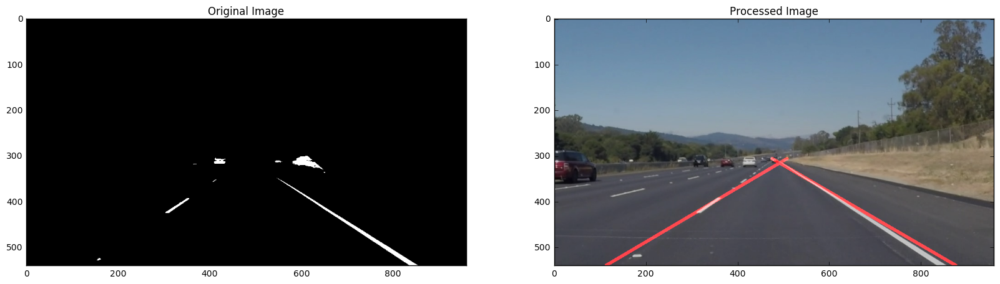

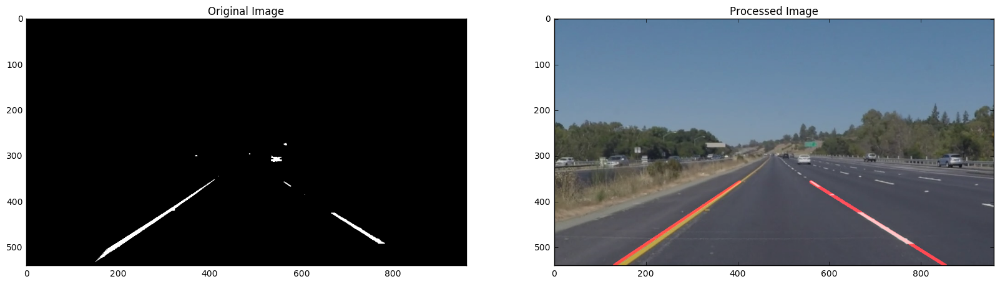

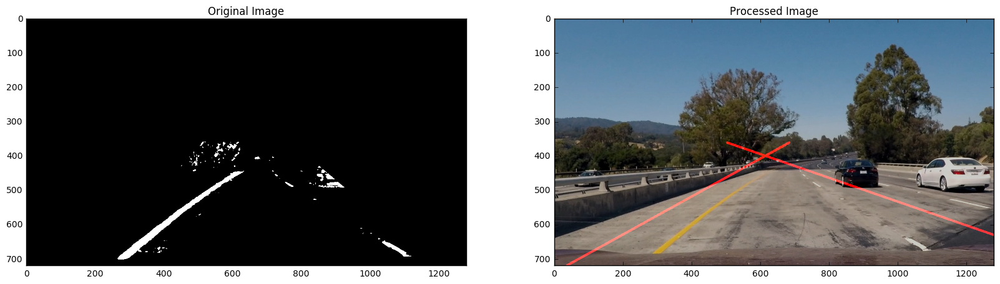

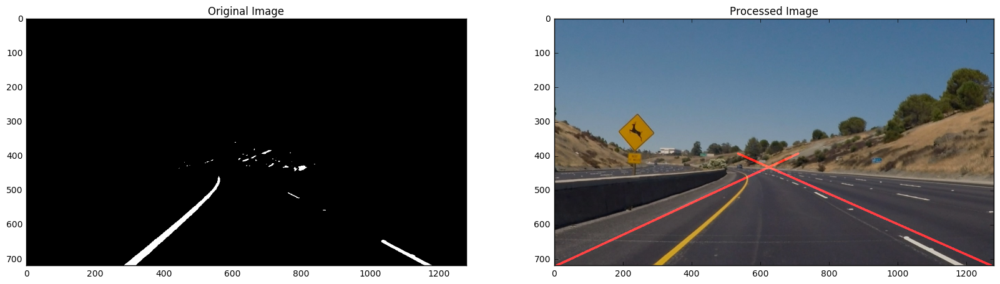

In [351]:
# Display images before and after the pipeline
for image_name in glob.glob("test_images/*"):
    img = mpimg.imread(image_name)
    result = process_image(img)